In [5]:
#from skimage.io import imread, imsave
from microfilm.microplot import microshow
#from nd2reader import ND2Reader
import numpy as np
import re
import os
import nd2
import matplotlib.pyplot as plt
import pyclesperanto_prototype as cle
from stardist.models import StarDist2D
from stardist import random_label_cmap, _draw_polygons, export_imagej_rois
from csbdeep.utils import normalize
from stardist import random_label_cmap
import stackview
from skimage import measure, morphology
import pandas as pd 
import pyclesperanto_prototype as cle
from tifffile import imread, imwrite
np.random.seed(6)
lbl_cmap = random_label_cmap()

In [6]:
def detect_nuclei_stardist(image, model_name='2D_versatile_fluo'):
    model = StarDist2D.from_pretrained(model_name)
    axis_norm = (0,1)
    image = normalize(image, 1,99.8, axis=axis_norm)
    labels, details = model.predict_instances(image)
    return(labels)

def filter_labels_by_size(label_image,min_size,max_size):
    out = np.copy(label_image)
    component_sizes = np.bincount(label_image.ravel())
    too_small = component_sizes < min_size
    too_small_mask = too_small[label_image]
    out[too_small_mask] = 0
    too_big = component_sizes > max_size
    too_big_mask = too_big[label_image]
    out[too_big_mask] = 0
    return(out)


def get_label_props(label_image,intensity_image):
    properties = measure.regionprops_table(label_image=label_image, intensity_image=np.round(intensity_image), 
                            properties=('label','area','intensity_mean','axis_major_length','axis_minor_length','eccentricity','centroid'))
    data = pd.DataFrame(properties)
    return(data)

def get_background_props(label_image,intensity_image):
    bg=np.copy(label_image)
    bg[np.where(label_image>1)]=0
    bg[np.where(label_image==0)]=1
    #stackview.insight(bg) 
    data=get_label_props(bg, intensity_image)
    return(data)

def plot_labels_on_image(label_image,intensity_image,title=""):
    outlines = cle.detect_label_edges(label_image)
    binary_borders = cle.detect_label_edges(label_image)
    #labeled_borders = binary_borders * label_image
    axis_norm = (0,1)
    plt.figure(figsize=(15,8))
    img_show = normalize(image,1,90, axis=axis_norm) if image.ndim==2 else image[...,0]
    #coord, points, prob = details['coord'], details['points'], details['prob']
    plt.subplot(131); plt.imshow(img_show, cmap='gray',vmin=np.min(image),vmax=np.max(image)); plt.axis('off')
    plt.imshow(image)
    plt.title("Nuclei")
    plt.subplot(132); plt.imshow(img_show, cmap='gray',vmin=np.min(image),vmax=np.max(image)); plt.axis('off')
    a = plt.axis()
    #_draw_polygons(coord, None, None, show_dist=False)
    plt.imshow(outlines, alpha=0.5)
    plt.axis(a)
    plt.title("Outlines")
    plt.subplot(133); plt.imshow(img_show, cmap='gray'); plt.axis('off')
    plt.imshow(label_image, cmap=lbl_cmap, alpha=0.5)
    plt.title("Regions")
    plt.suptitle(title,y=0.9)
    plt.tight_layout()
    #plt.show()
    return(plt)




In [7]:
#work_dir = "/Users/semple/Documents/MeisterLab/otherPeopleProjects/Moushumi/kleisinCleavage/SMC1/microscopy/20230907_941-9_SMCGFP1_HS"
work_dir = "/mnt/external.data/MeisterLab/jsemple/microscopy/20231213_941-9_SMC1GFP_HS"
min_size = 10
max_size = 2000
model_name = '2D_versatile_fluo'

os.makedirs(work_dir+'/csv_'+str(min_size)+'_'+str(max_size), exist_ok=True)  
os.makedirs(work_dir+'/filt_labels_'+str(min_size)+'_'+str(max_size), exist_ok=True)
file_list = os.listdir(work_dir+"/rotated_cropped_mask")
image_file_list = [file for file in file_list if file.startswith('n2v_')]


In [8]:
os.makedirs(work_dir+'/metadata', exist_ok=True)
dicList=[]
for file_name in image_file_list:
        base_name=str(re.sub('.tif','',re.sub('n2v_', '', file_name)))
        #print(base_name)
        #file_name='PMW947_HS_003.nd2'
        #base_name=str(re.sub('.nd2','', file_name))
        #print(base_name)
        with nd2.ND2File(base_name+'.nd2') as ndfile:
                with open(work_dir+'/metadata/'+base_name+'_description.txt', "w") as text_file:
                        text_file.write(ndfile.text_info['description'])
                with open(work_dir+'/metadata/'+base_name+'_capturing.txt', "w") as text_file:
                        text_file.write(ndfile.text_info['capturing'])
                cap = pd.read_csv(work_dir+'/metadata/'+base_name+'_capturing.txt',sep=":",index_col=False,header=None,names=['attribute','value'])
                data = {'path': ndfile.path,
                        'numZ': ndfile.sizes['Z'],
                        'numXY': ndfile.sizes['Y'],
                        'channelCount': ndfile.attributes.channelCount,
                        'Zstep': ndfile.experiment[0].parameters.stepUm,
                        'bitsPercomponentInMemory': ndfile.attributes.bitsPerComponentInMemory,
                        'bitsPercomponentInSignificant': ndfile.attributes.bitsPerComponentSignificant,
                        'channelwavelength': ndfile.metadata.channels[0].channel.name,
                        'objectiveMagnification': ndfile.metadata.channels[0].microscope.objectiveMagnification,
                        'objectiveName': ndfile.metadata.channels[0].microscope.objectiveName,
                        'objectiveNumericalAperture': ndfile.metadata.channels[0].microscope.objectiveNumericalAperture,
                        'pinholediamterUm': ndfile.metadata.channels[0].microscope.pinholeDiameterUm,
                        'Exposure': cap.loc[cap['attribute']=='Exposure','value'].values[0],
                        'Binning': cap.loc[cap['attribute']=='Binning','value'].values[0],
                        'ScanMode': cap.loc[cap['attribute']=='Scan Mode','value'].values[0],
                        'Denoise.ai': cap.iloc[5,0],
                        'Clarify.ai': cap.iloc[6,0],
                        'MultiExcitation': cap.loc[cap['attribute']=='MultiExcitation','value'].values[0],
                        'dXPos': int(ndfile.unstructured_metadata()['ImageMetadataSeqLV|0']['SLxPictureMetadata']['dXPos']),
                        'dYPos': int(ndfile.unstructured_metadata()['ImageMetadataSeqLV|0']['SLxPictureMetadata']['dYPos'])
                }
                dicList.append(data)

    
df=pd.DataFrame(dicList)
df.to_csv(path_or_buf=work_dir+"/metadata/metadataTable.csv")


PMW947_HS_001
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


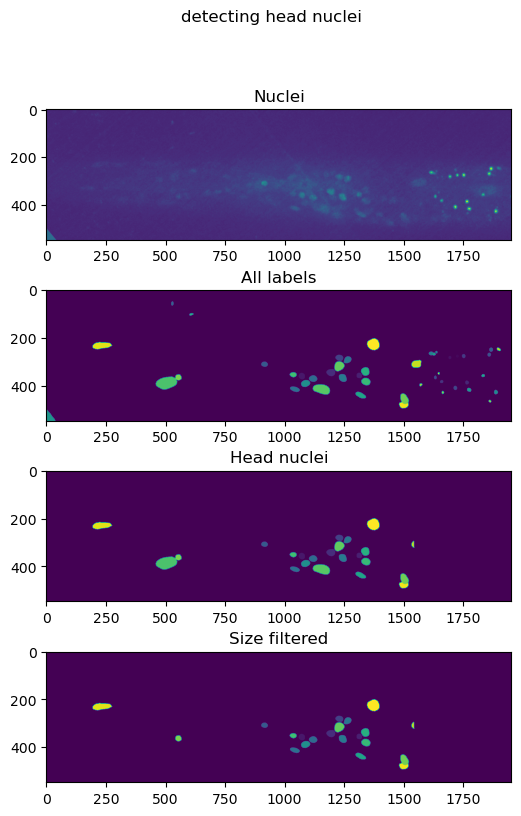

PMW947_HS_006
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


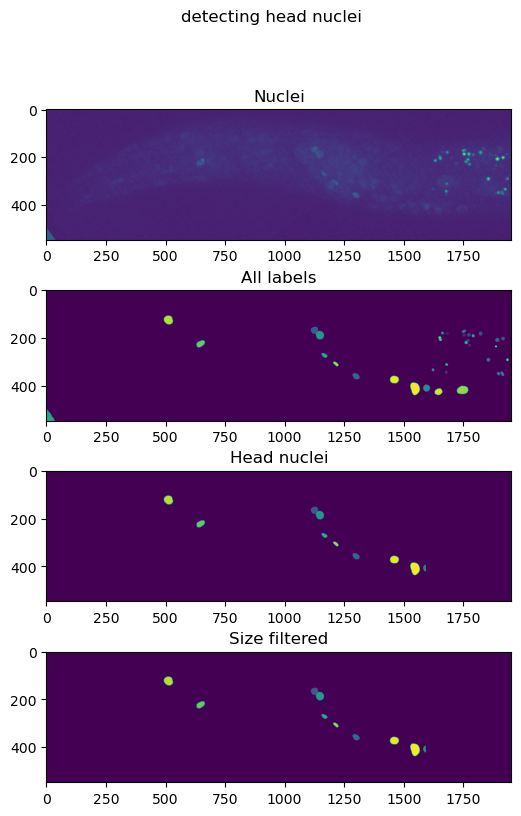

PMW948_NHS_006
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


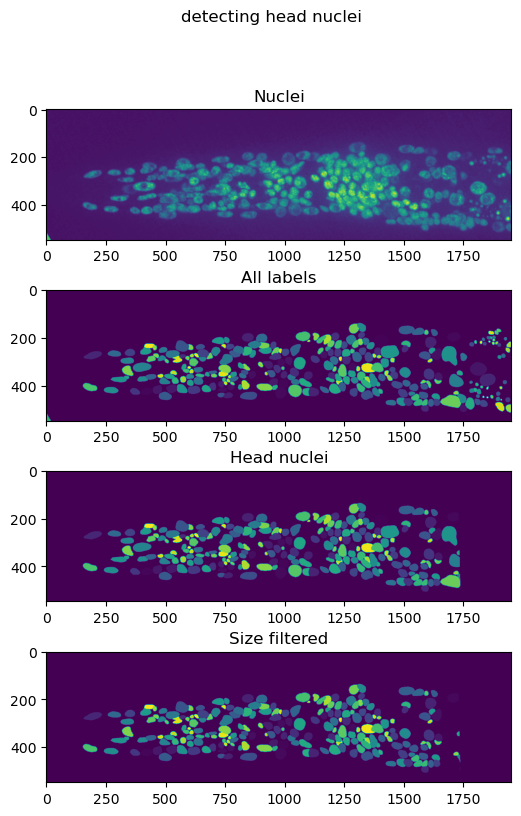

PMW947_NHS_006
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


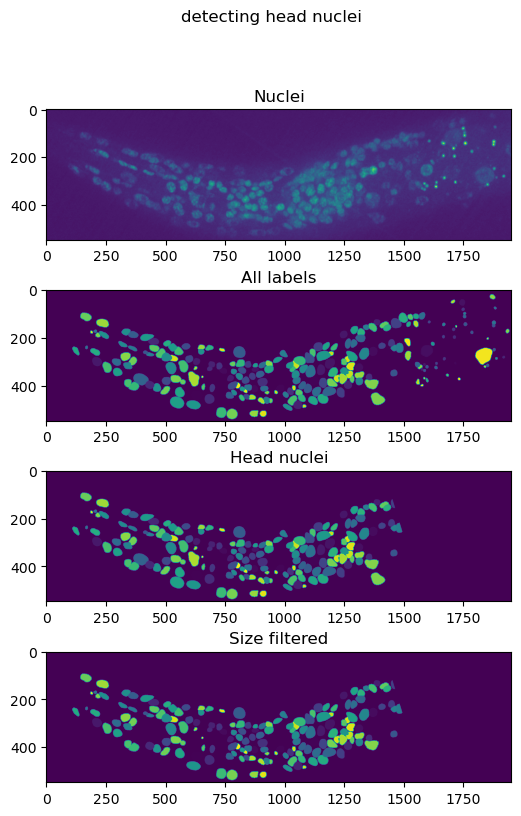

PMW948_NHS_001
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


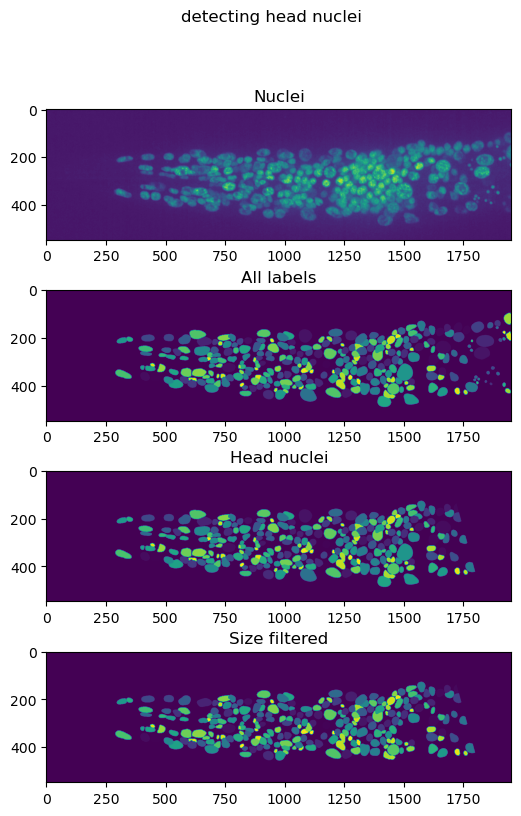

PMW947_NHS_001
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


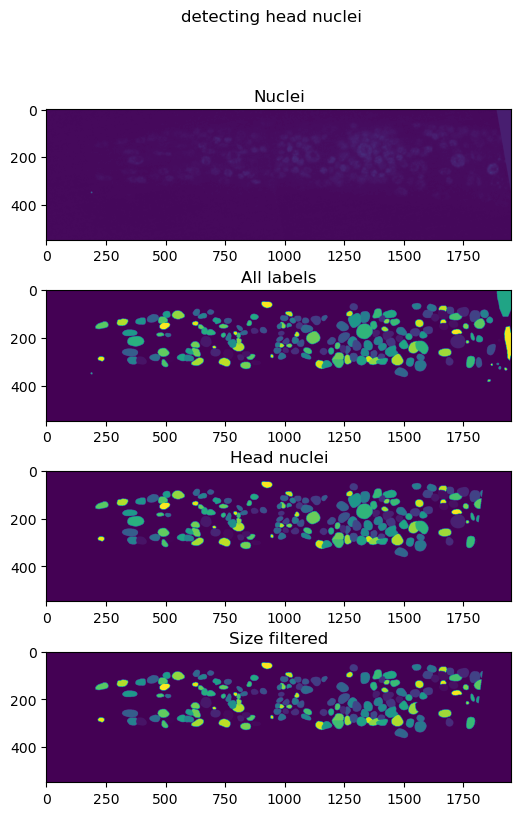

PMW941_NHS_009
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


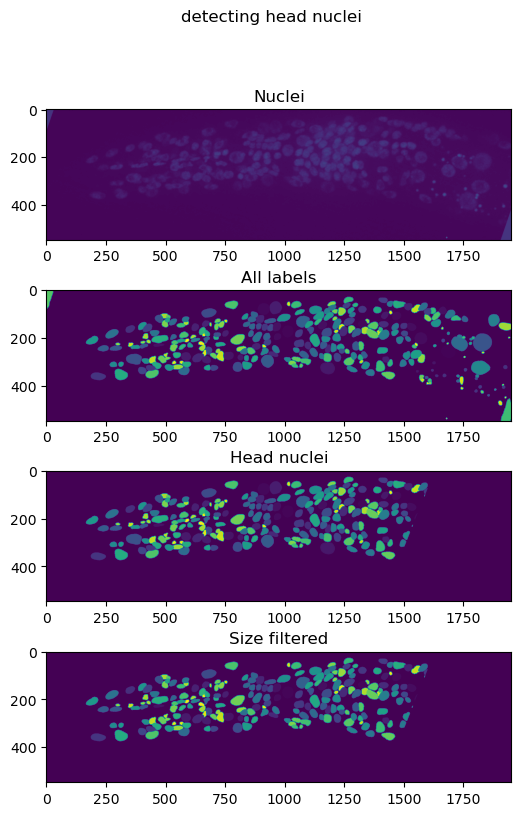

PMW949_NHS_005
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


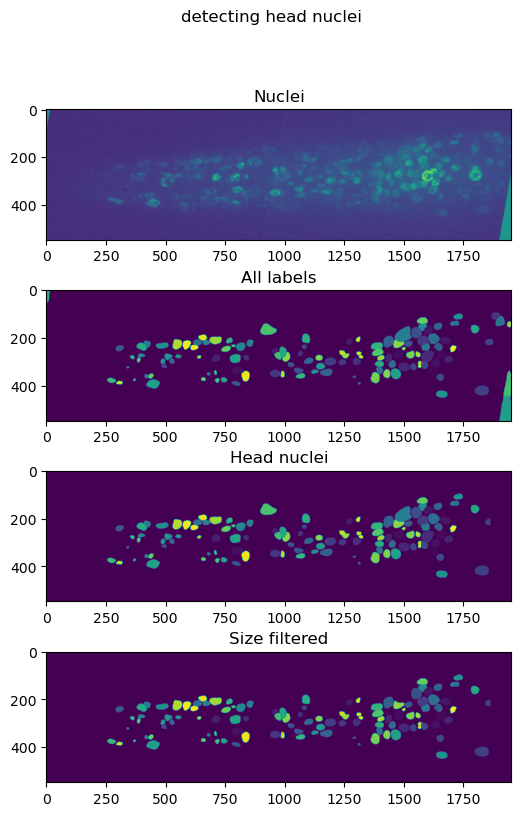

PMW948_HS_003
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


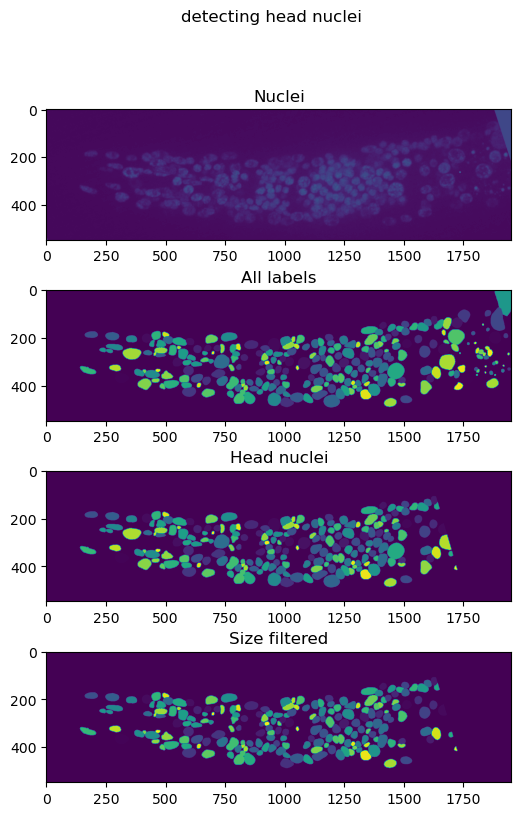

PMW948_HS_004
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


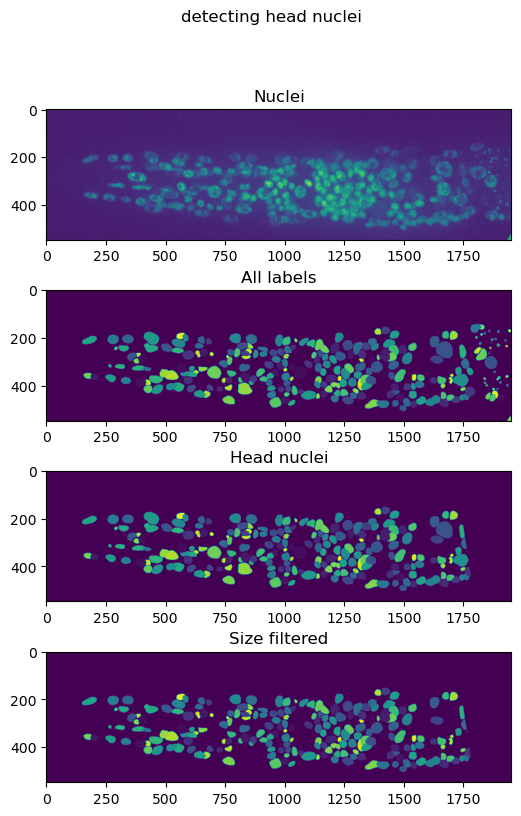

PMW941_HS_002
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


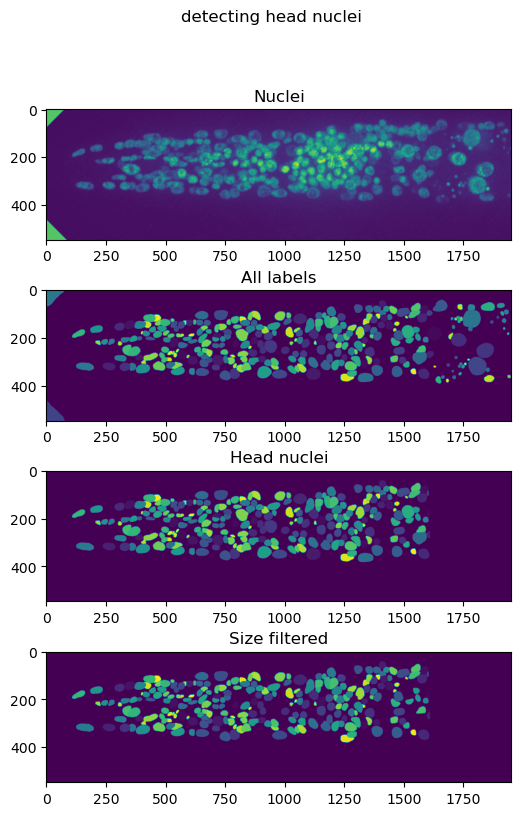

PMW941_HS_005
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


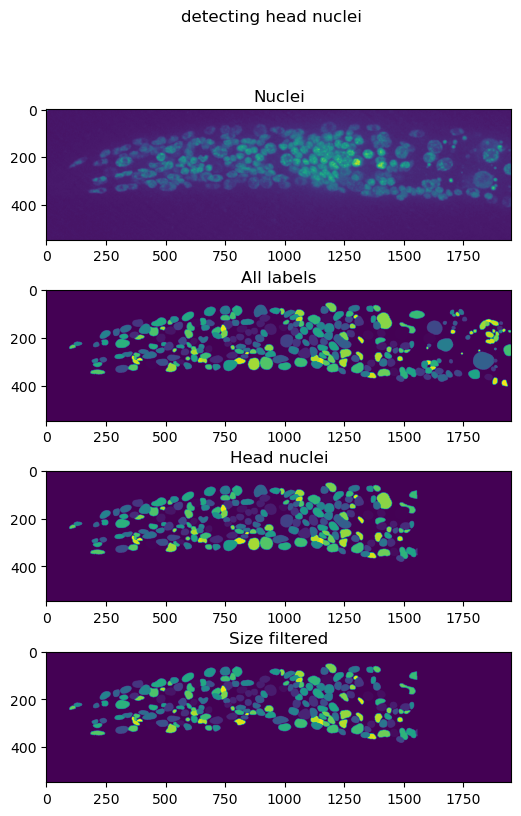

PMW947_HS_007
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


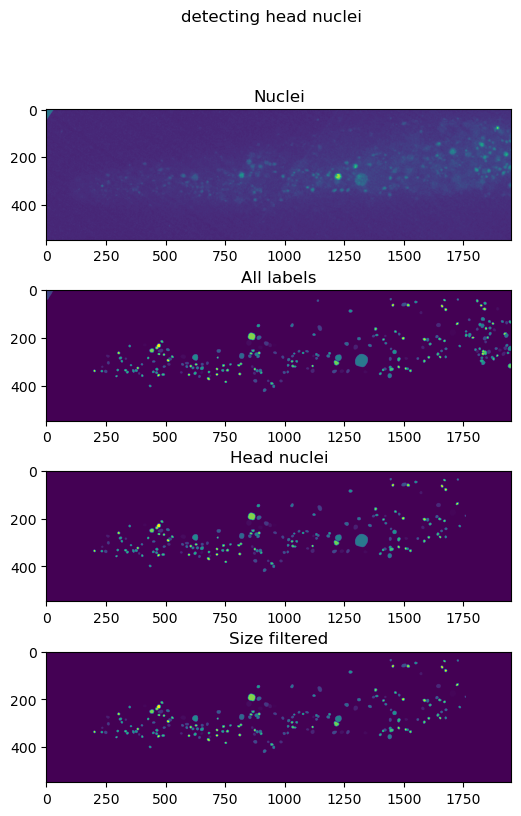

PMW949_HS_006
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


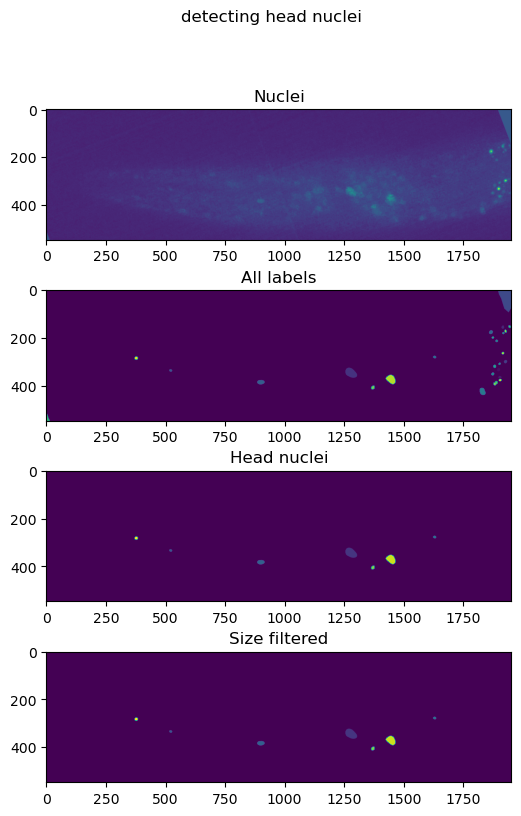

PMW941_HS_004
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


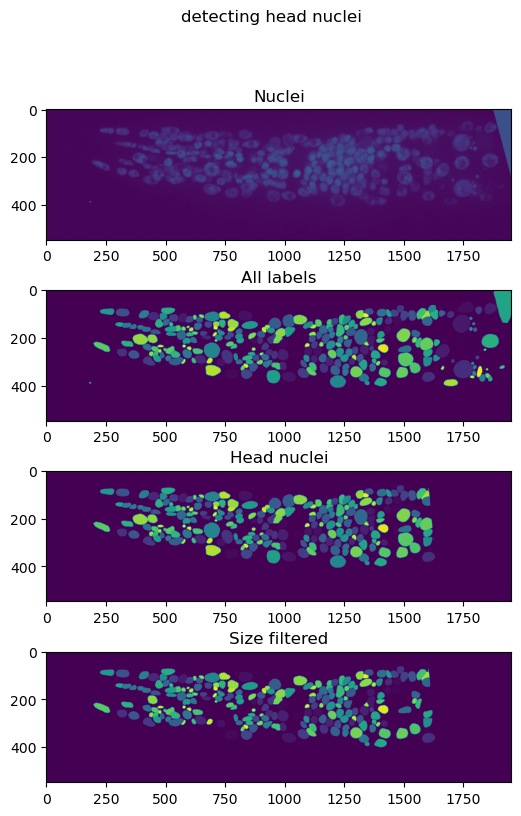

PMW949_HS_001
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


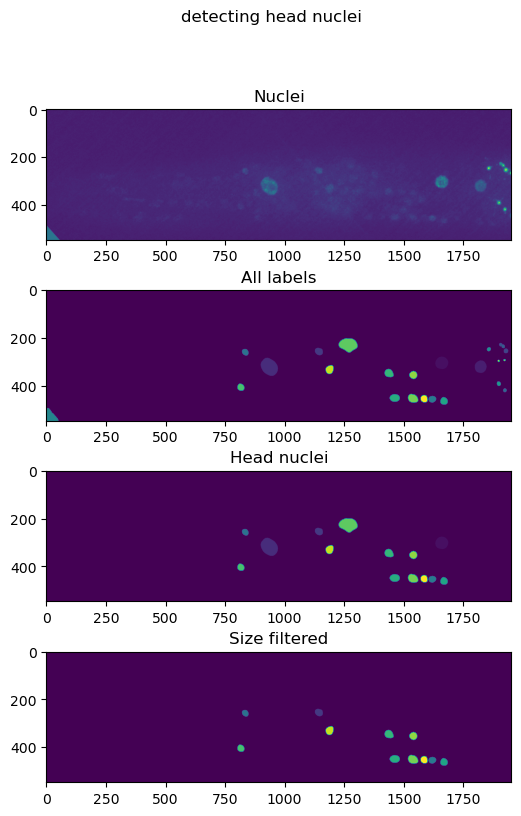

PMW941_HS_003
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


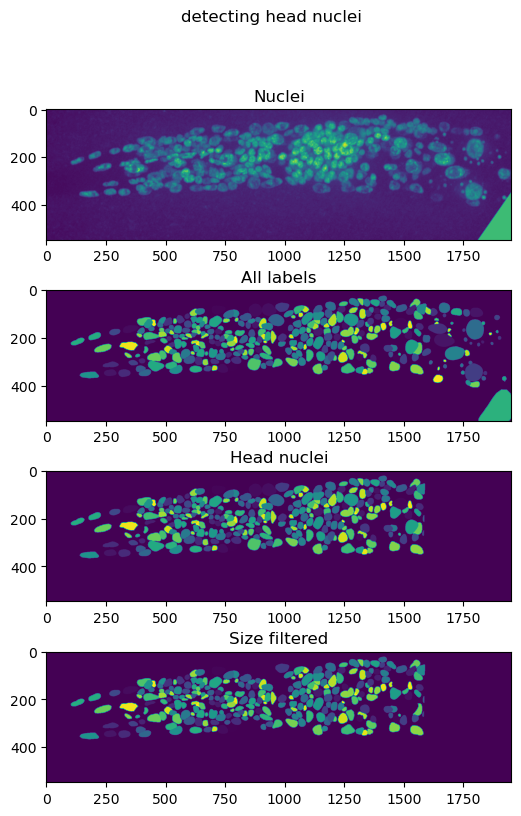

PMW948_HS_005
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


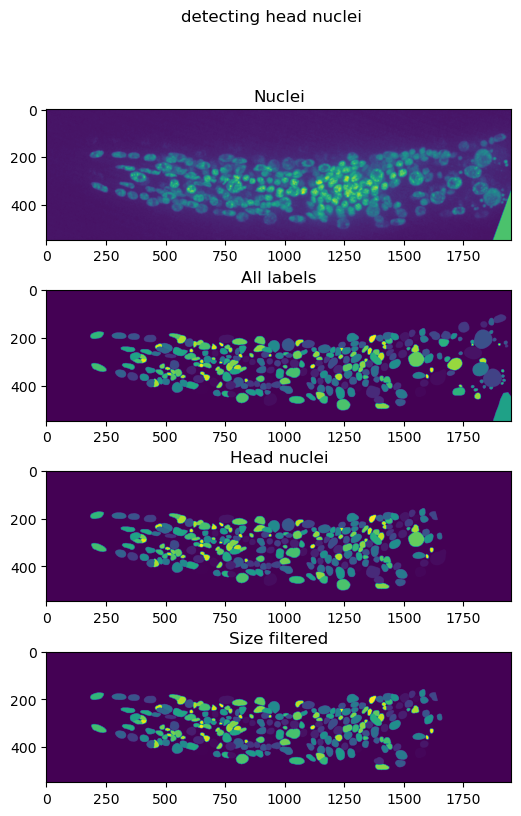

PMW949_NHS_004
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


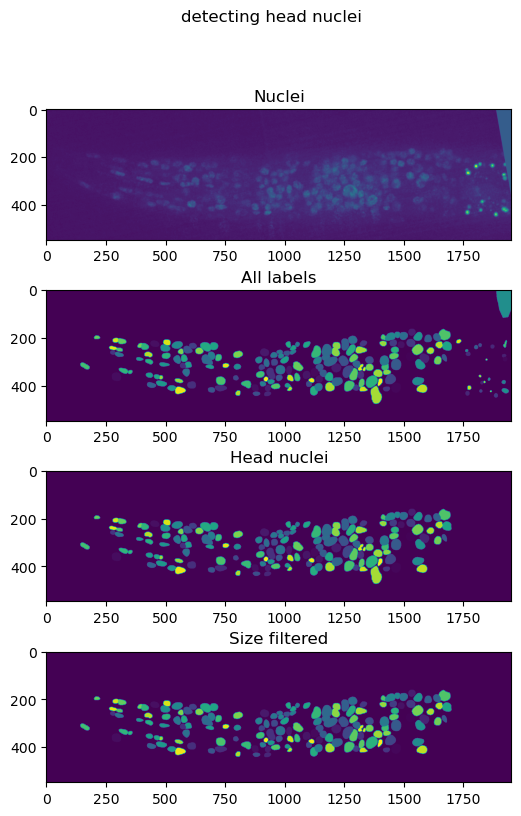

PMW948_HS_002
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


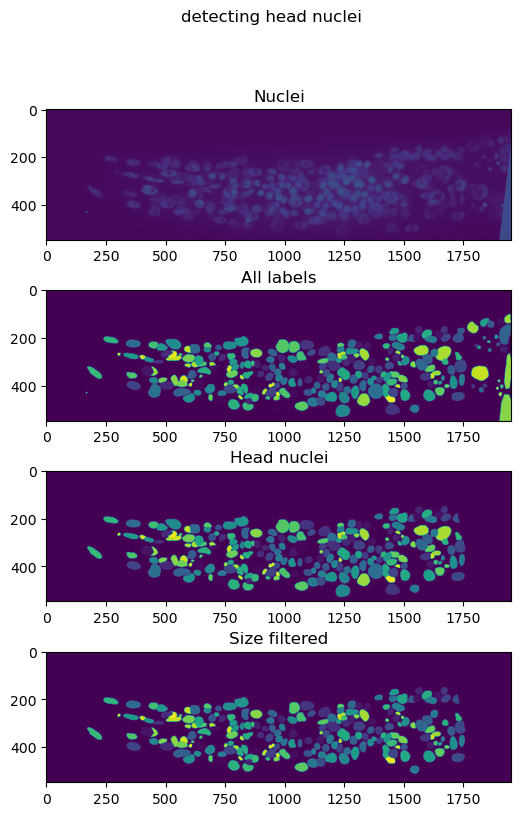

PMW941_NHS_006
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


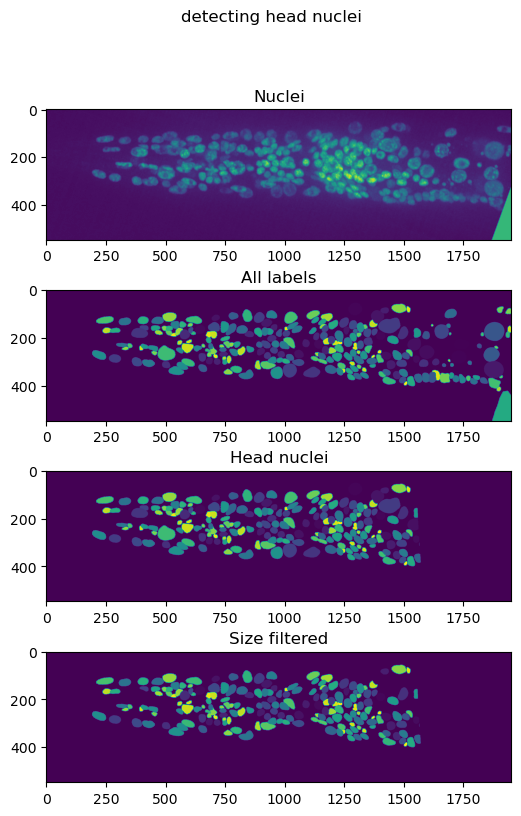

PMW941_NHS_001
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


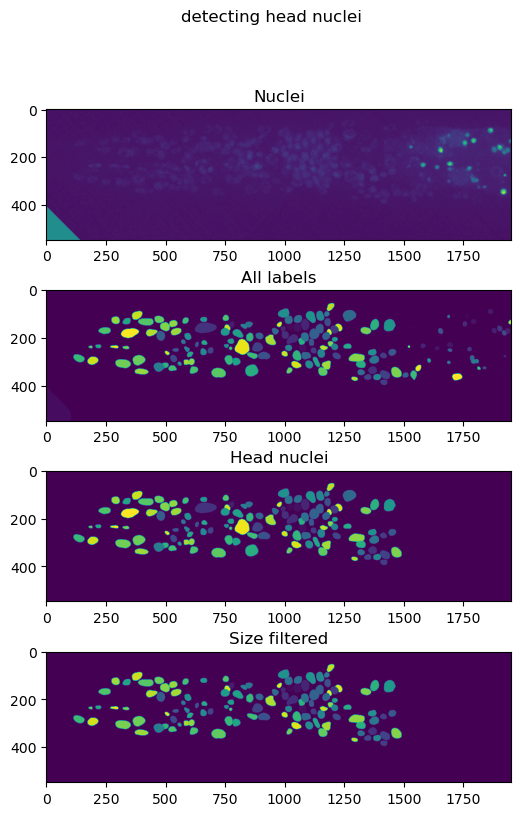

PMW941_NHS_008
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


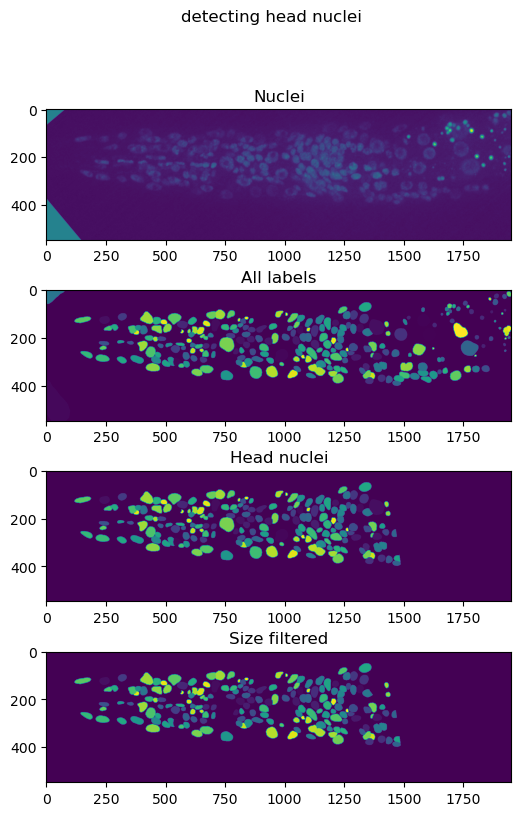

PMW949_HS_002
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


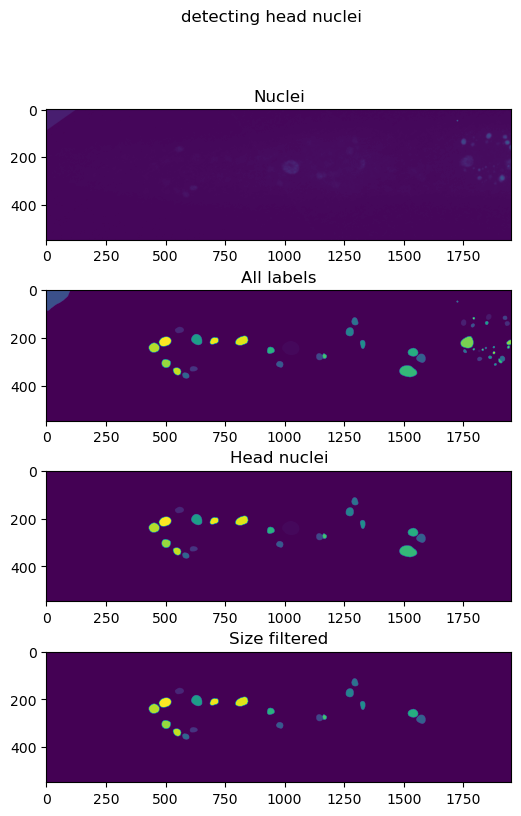

PMW941_HS_007
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


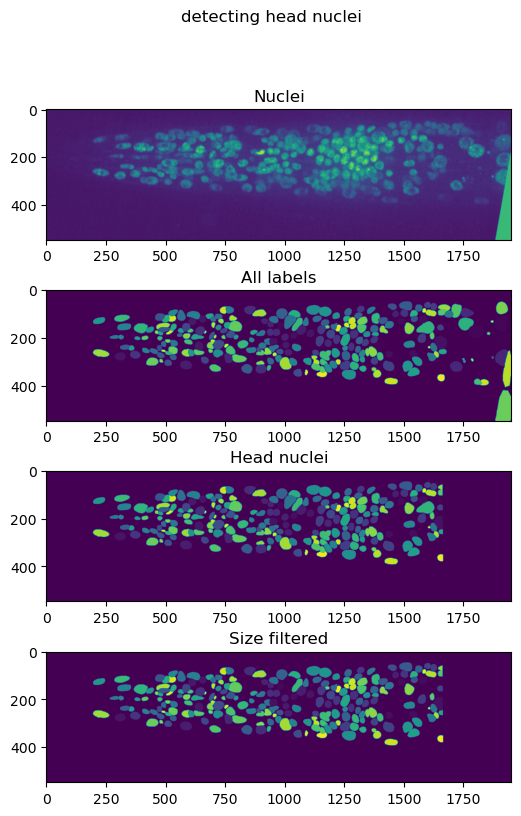

PMW949_HS_005
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


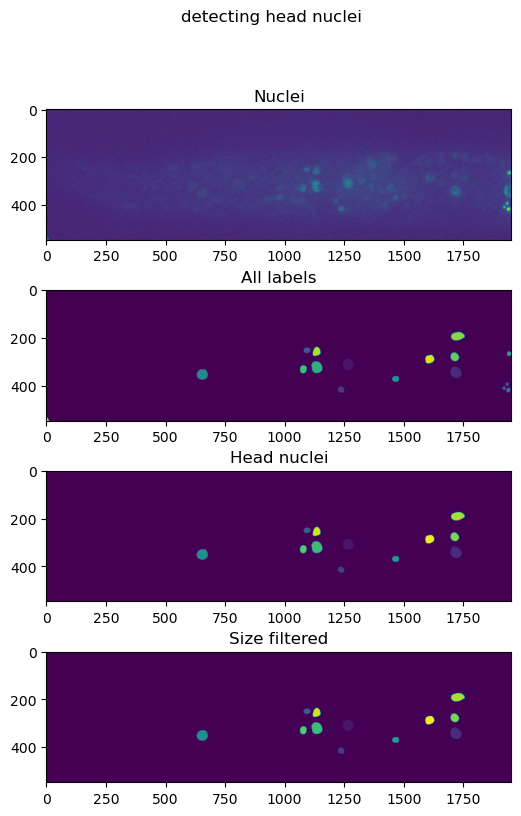

PMW948_HS_001
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


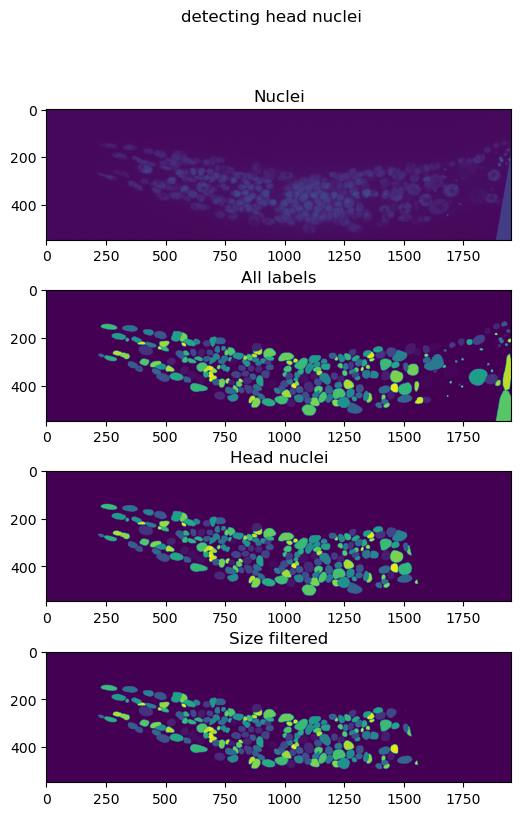

PMW948_HS_006
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


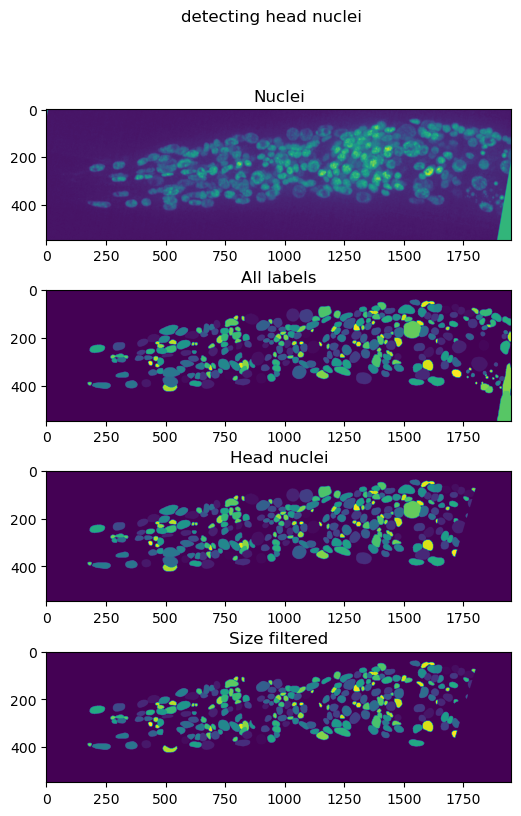

PMW941_NHS_002
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


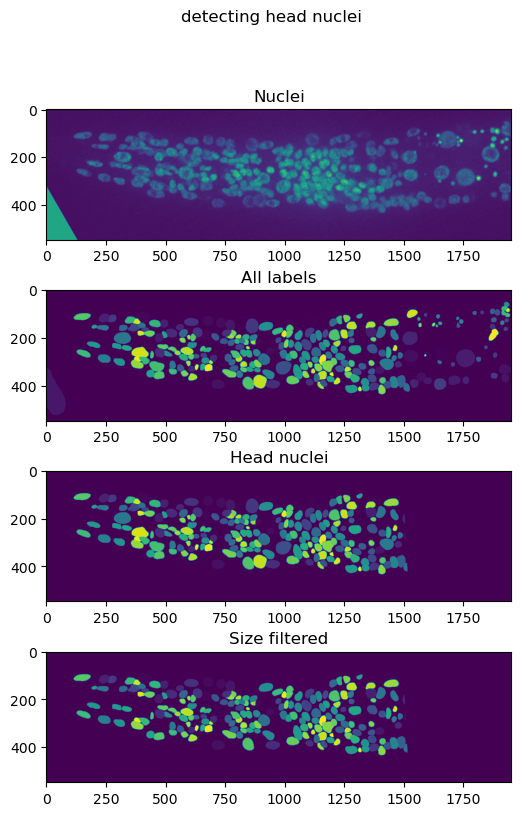

PMW941_NHS_005
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


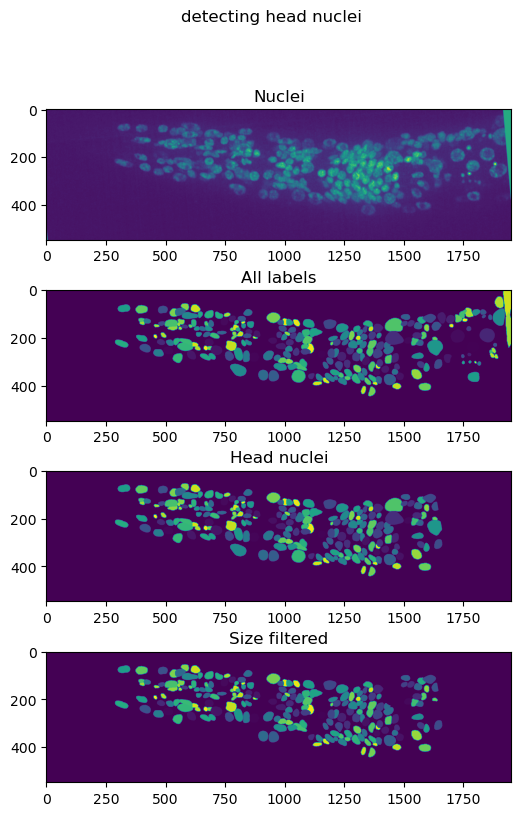

PMW948_NHS_004
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


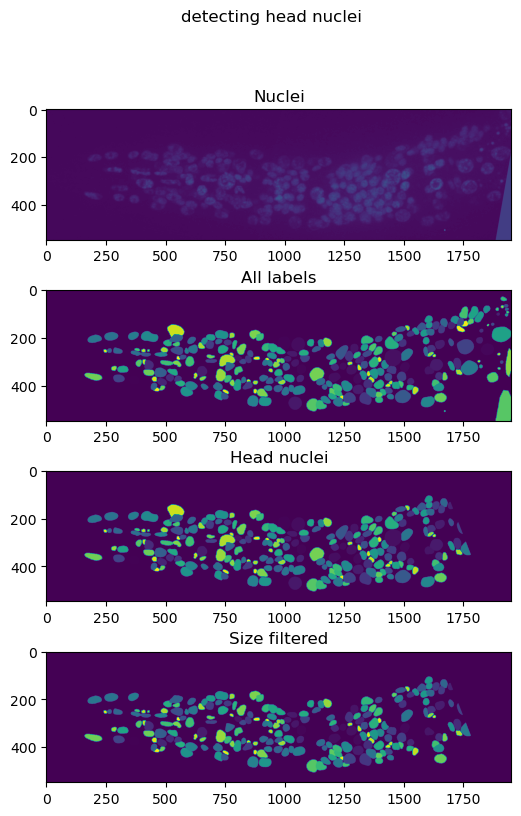

PMW947_NHS_004
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


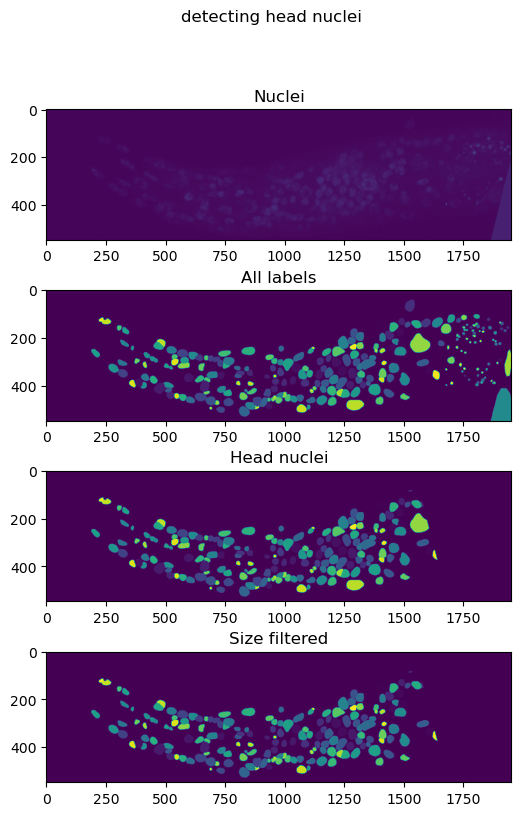

PMW948_NHS_003
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


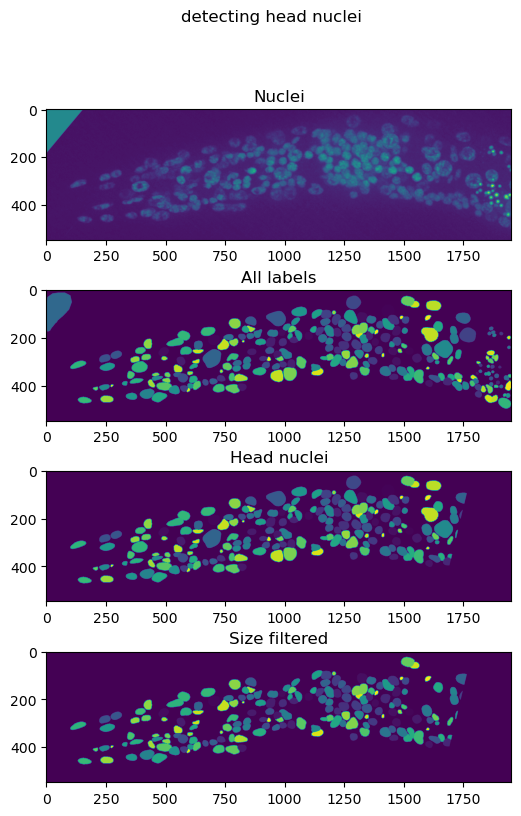

PMW947_NHS_003
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


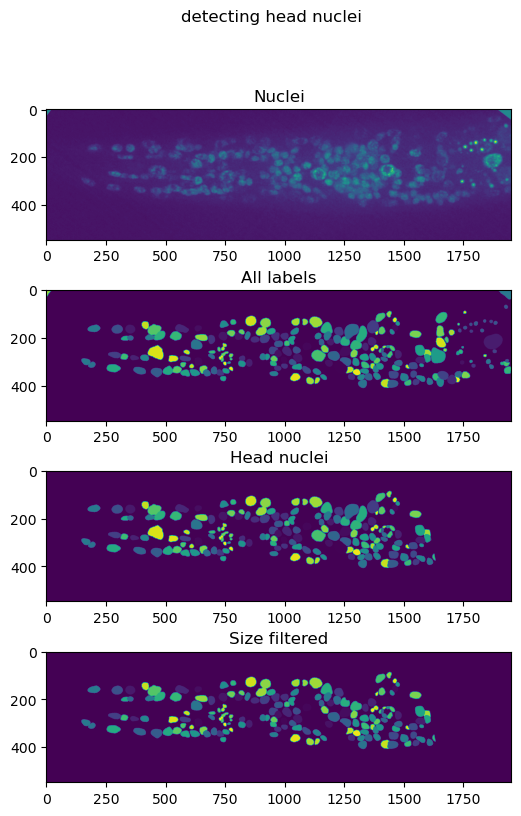

PMW947_HS_003
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


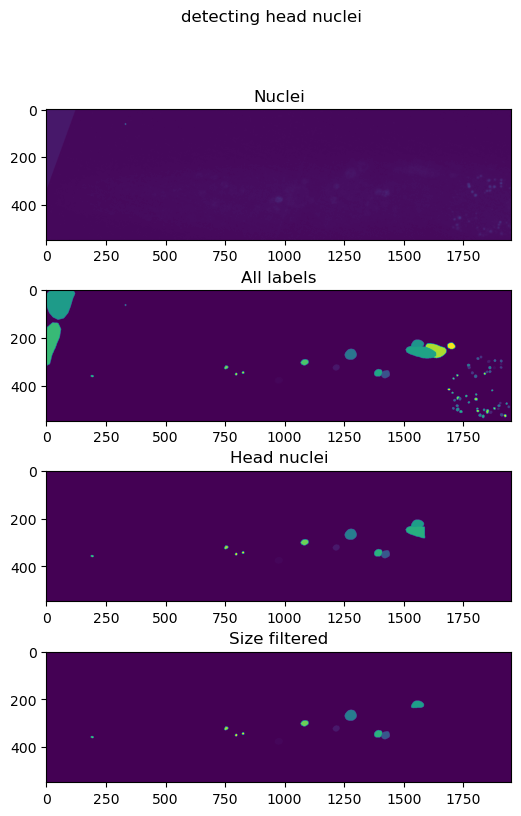

PMW947_HS_004
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


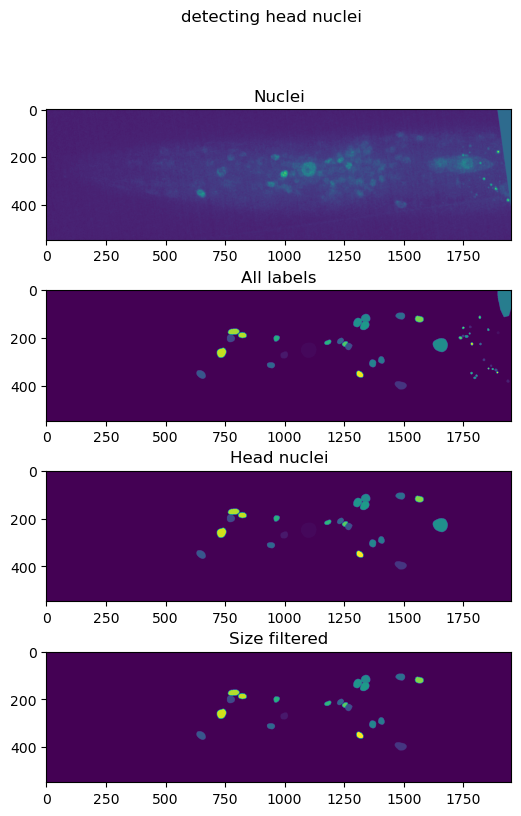

PMW941_NHS_004
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


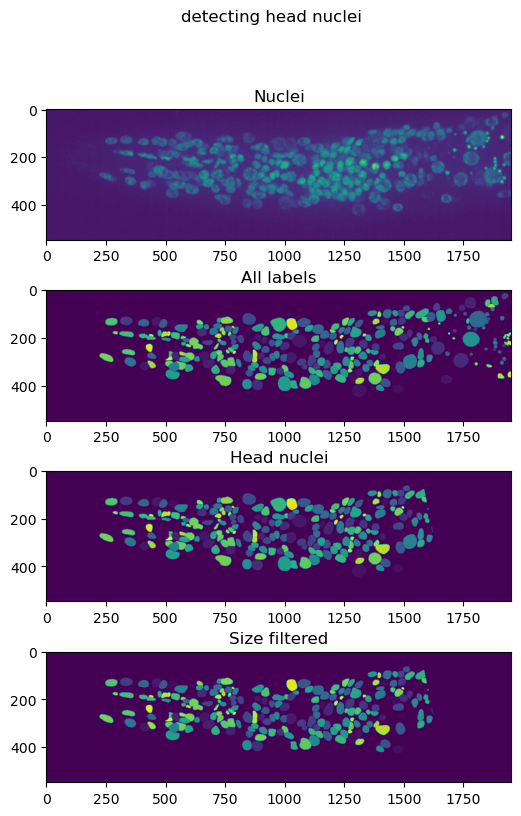

PMW941_NHS_003
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


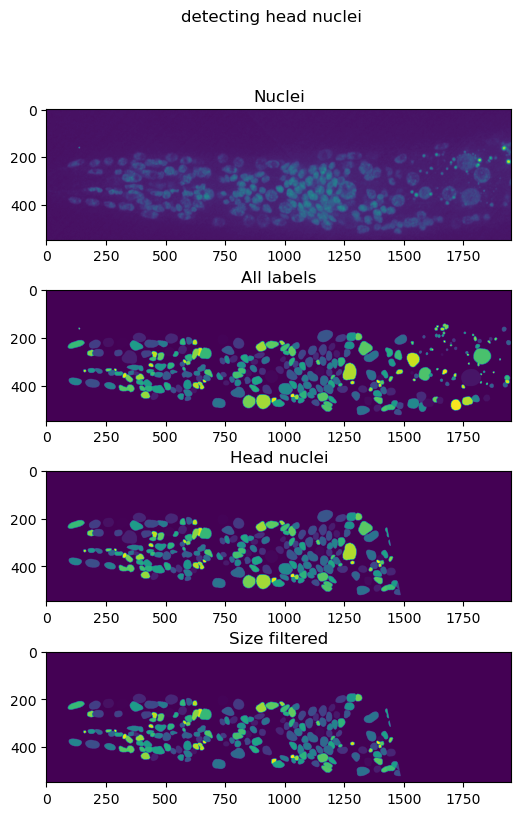

PMW949_NHS_001
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


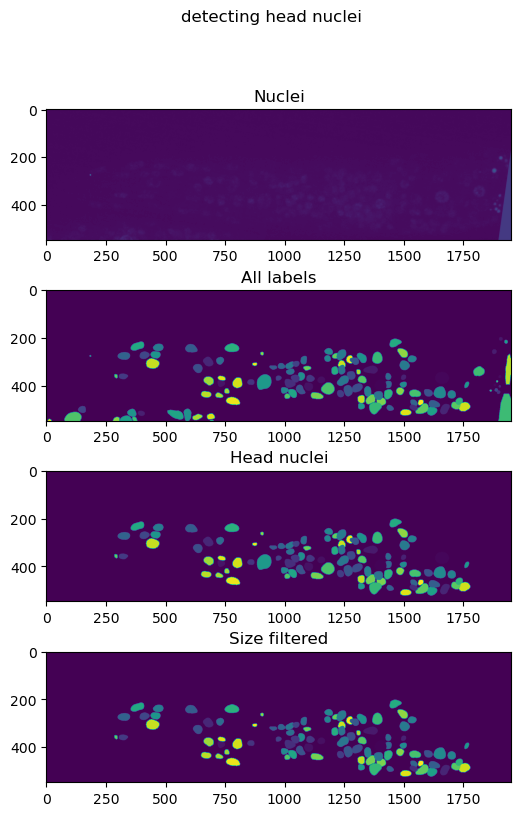

PMW941_HS_008
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


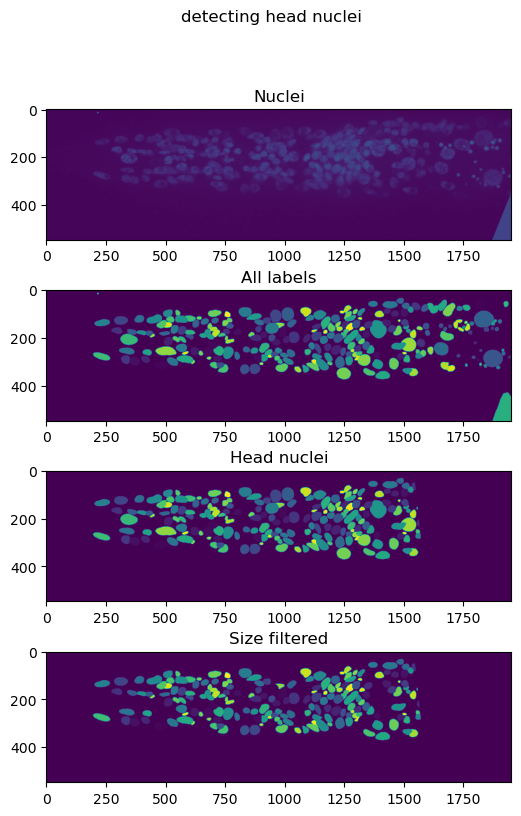

PMW949_NHS_006
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


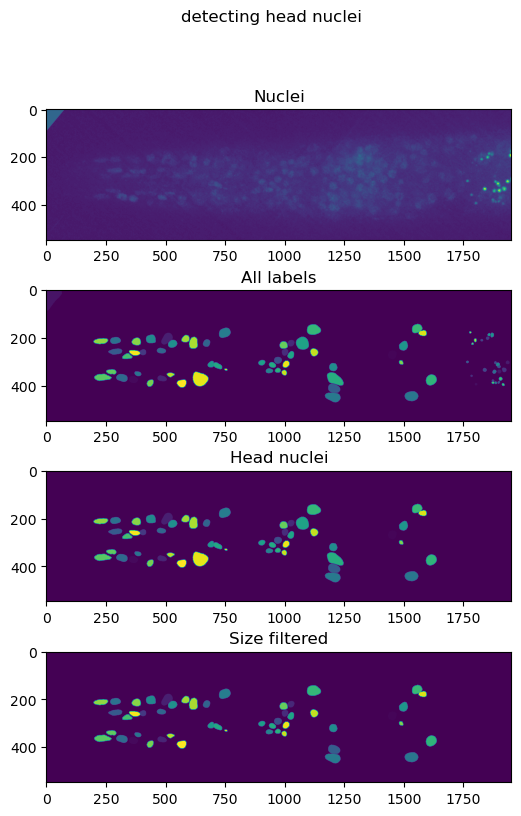

PMW941_HS_006
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


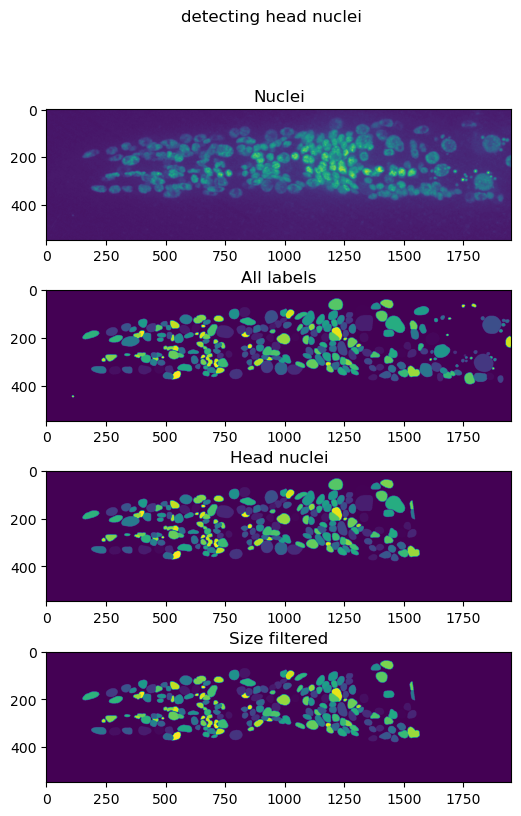

PMW949_HS_004
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


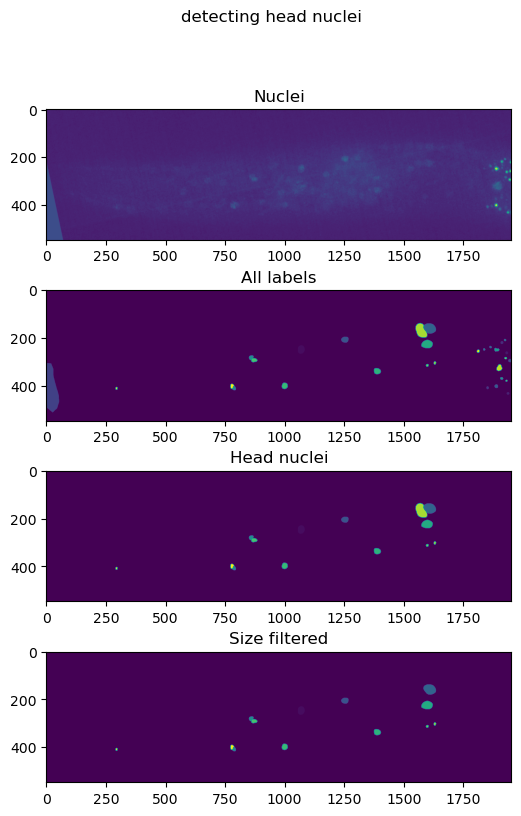

PMW941_HS_001
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


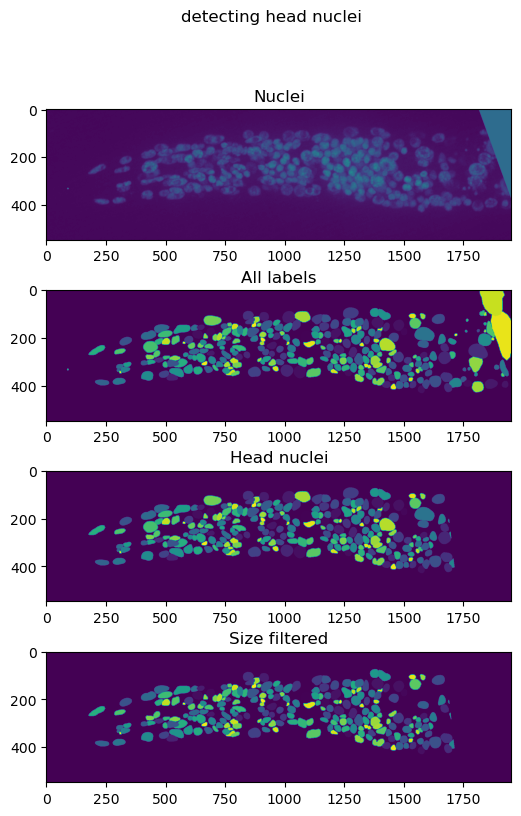

PMW949_HS_003
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


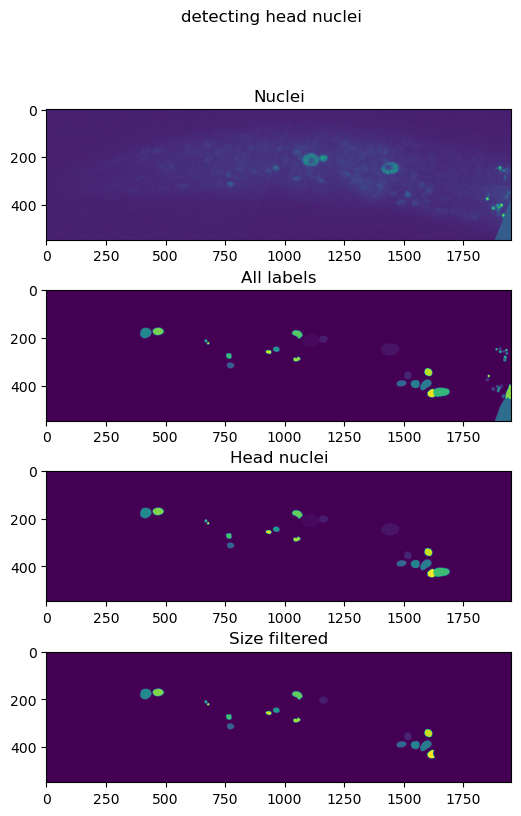

PMW947_HS_005
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


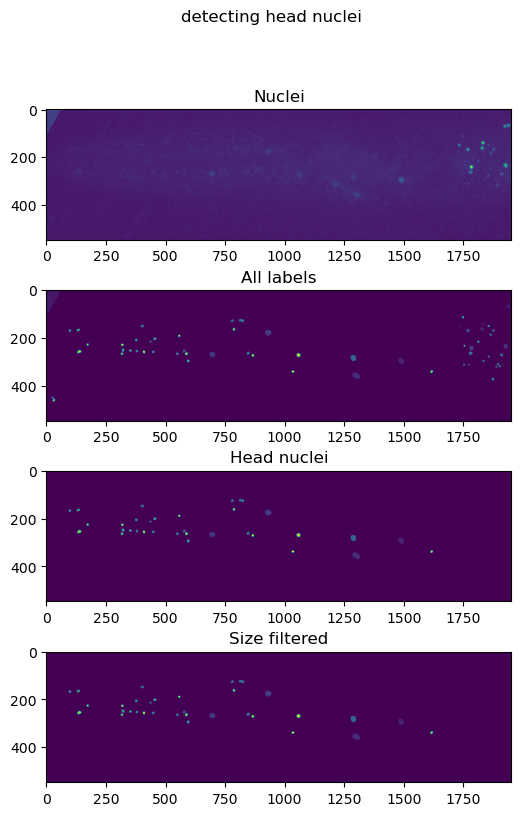

PMW947_HS_002
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


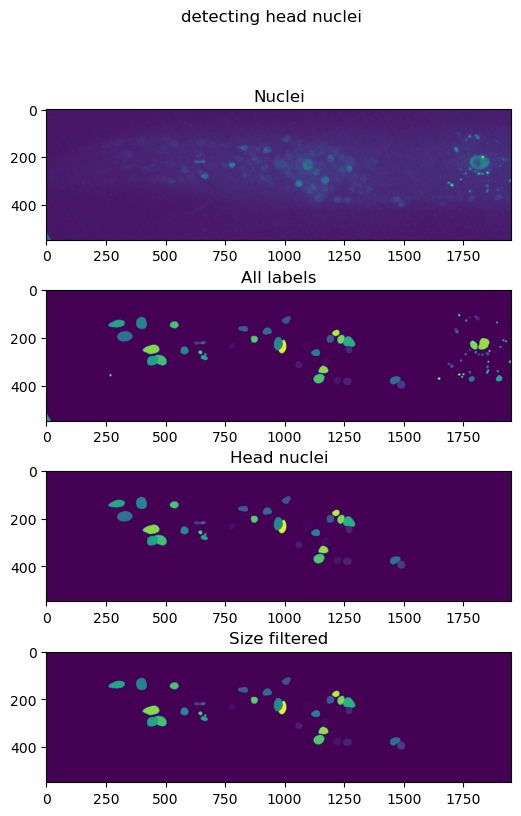

PMW948_NHS_002
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


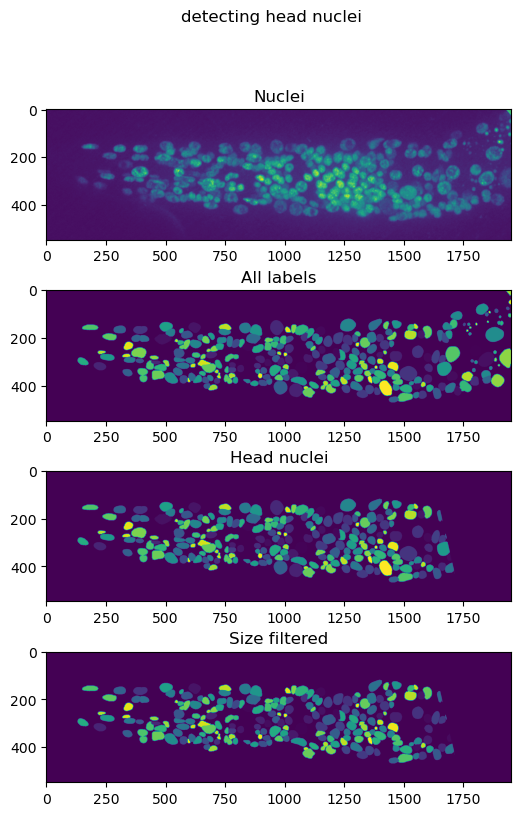

PMW947_NHS_002
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


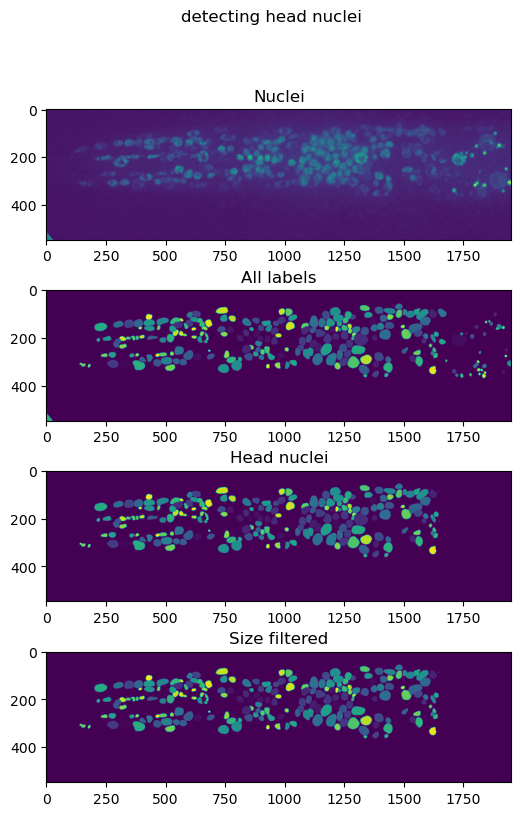

PMW948_NHS_005
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


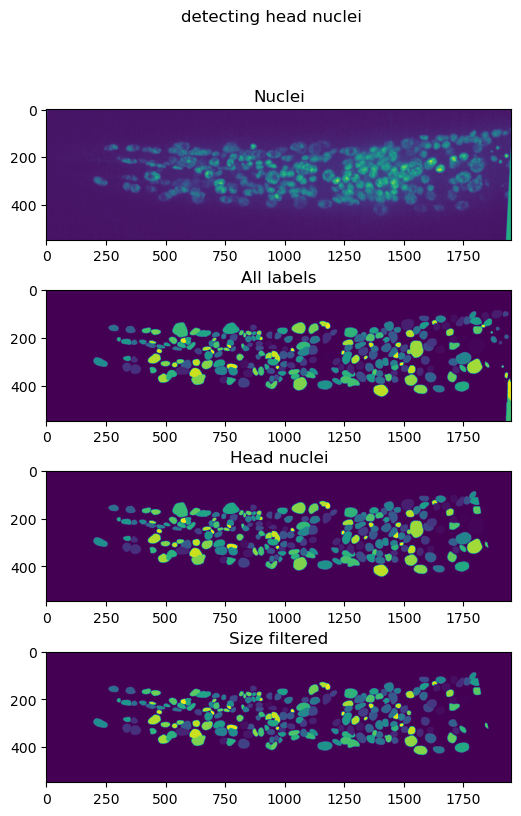

PMW947_NHS_005
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


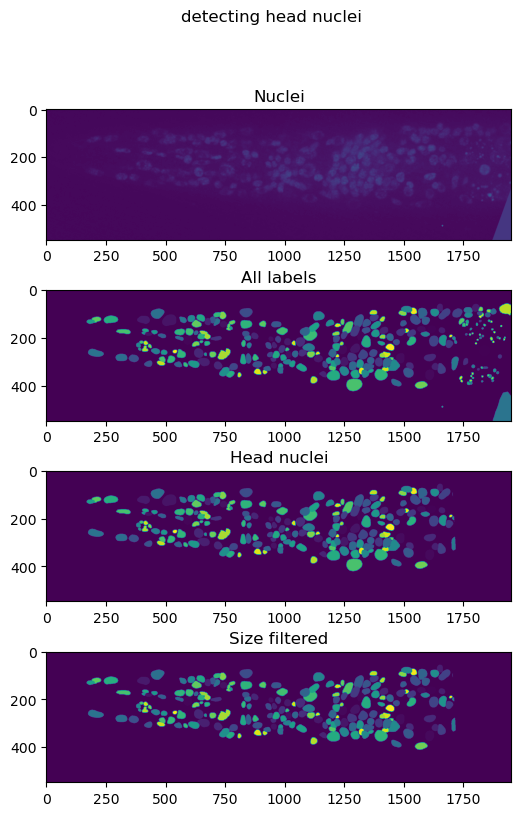

In [9]:

#file_name='PMW947_HS_003.nd2'
for file_name in image_file_list:
    base_name=str(re.sub('.tif','',re.sub('n2v_', '', file_name)))
    print(base_name)
    # read in denoised and raw images
    image = imread(work_dir+'/rotated_cropped_mask/n2v_'+base_name+'.tif')
    #image = np.max(image,axis=0)
    image_raw = imread(work_dir+'/rotated_cropped_mask/raw_'+base_name+'.tif') 
    #image_raw = np.max(image_raw, axis=0)

    # read in head and background mask
    head_mask = imread(work_dir+'/rotated_cropped_mask/phaMask_'+base_name+'.tif')
    databg = get_label_props(head_mask, intensity_image=image_raw)
    databg["base_name"]=base_name
    databg.to_csv(work_dir+'/csv_'+str(min_size)+'_'+str(max_size)+'/'+base_name+'_head_bg.csv') 

    # detect nuclei
    labels = detect_nuclei_stardist(image, model_name)


    # get background intensity
    bg = get_background_props(labels, image_raw)
    bg["base_name"]=base_name
    bg.to_csv(work_dir+'/csv_'+str(min_size)+'_'+str(max_size)+'/'+base_name+'_bg.csv') 

    head_nuclei = labels.copy()
    head_nuclei[(labels == 0) | (head_mask != 2)] = 0

    # filter by size
    filt_labels = filter_labels_by_size(head_nuclei, min_size, max_size)

    fig=plt.figure(figsize=(6,9))
    ##fig, axs = plt.subplots(4,sharex=True, sharey=True)
    fig.suptitle('detecting head nuclei')
    fig.add_subplot(4,1,1)
    plt.imshow(image)
    plt.title("Nuclei")
    fig.add_subplot(4,1,2)
    plt.imshow(labels)
    plt.title("All labels")
    fig.add_subplot(4,1,3)
    plt.imshow(head_nuclei)
    plt.title("Head nuclei")
    fig.add_subplot(4,1,4)
    plt.imshow(filt_labels)
    plt.title("Size filtered")
    plt.show()
    fig.savefig(work_dir+'/filt_labels_'+str(min_size)+'_'+str(max_size)+'/head_nuclei_'+base_name+'.png')


    # get region properties
    data=get_label_props(filt_labels, image_raw)
    data["base_name"]=base_name
    data.to_csv(work_dir+'/csv_'+str(min_size)+'_'+str(max_size)+'/'+base_name+'.csv') 
